# 🦎 Iguana Species Classification — Transfer Learning Assignment

In this notebook we will classify **7 species of iguana** using Transfer Learning.

The 7 classes are:
- Black_spiny_tailed_iguana
- Brown_anole
- Cuban_knight_anole
- Desert_iguana
- Green_anole
- Green_iguana
- Lesser_Antillean_iguana

**Strategy:** We use a pretrained EfficientNetV2S model (trained on ImageNet) as a **feature extractor** with frozen weights, and add our own classification head on top.

---
### 📁 Expected folder structure
```
data/
  train/
    Black_spiny_tailed_iguana/  *.jpg
    Brown_anole/                *.jpg
    ...
  test/
    1.jpg, 2.jpg, ...
  train.csv               <- filename + label (for verification)
  test.csv                <- id column only (what we need to predict)
  Classes_nummering.xlsx  <- maps class names to numeric IDs
saved_models/             <- trained model will be saved here
```

## Step 0 — Install dependencies & Imports & GPU check

In [52]:
import tensorflow as tf

print(f"TensorFlow versie: {tf.__version__}")
print(f"Aantal GPU's gevonden: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow versie: 2.21.0
Aantal GPU's gevonden: 0


In [53]:
# Install all required packages
# Run this cell once; you can skip it on subsequent runs if packages are already installed
!pip install tensorflow>=2.16 \
             numpy \
             pandas \
             matplotlib \
             scikit-learn \
             openpyxl \
             Pillow


[notice] A new release of pip is available: 25.2 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [54]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.applications import EfficientNetV2S
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# ── Preprocessing for EfficientNetV2S ────────────────────────────────────────────
preprocess_input = tf.keras.applications.efficientnet_v2.preprocess_input


print(f"TensorFlow version : {tf.__version__}")
print(f"GPUs available     : {tf.config.list_physical_devices('GPU')}")

TensorFlow version : 2.21.0
GPUs available     : []


## Step 1 — Configuration

All the hyper-parameters you might want to tweak are collected here.

In [55]:
# ── paths ──────────────────────────────────────────────────────────────────────
DATA_DIR         = Path("data")
TRAIN_DIR        = DATA_DIR / "train"
TEST_DIR         = DATA_DIR / "test"
TRAIN_CSV        = DATA_DIR / "train.csv"
TEST_CSV         = DATA_DIR / "test.csv"
CLASSES_XLSX     = DATA_DIR / "Classes_nummering.xlsx"

SAVED_MODELS_DIR = Path("saved_models")
SAVED_MODELS_DIR.mkdir(exist_ok=True)   # create the folder if it doesn't exist yet
MODEL_PATH       = SAVED_MODELS_DIR / "iguana_model.keras"
SUBMISSION_PATH  = SAVED_MODELS_DIR / "submission.csv"

# ── image & training settings ──────────────────────────────────────────────────
IMG_SIZE         = 300      # EfficientNetV2S expects >= 224
BATCH_SIZE       = 32
EPOCHS           = 10
LEARNING_RATE    = 1e-3
VALIDATION_SPLIT = 0.2
SEED             = 42

NUM_CLASSES      = 7

## Step 2 — Explore the data

In [56]:
# ── Read the class numbering ────────────────────────────────────────────────────
classes_df = pd.read_excel(CLASSES_XLSX)
print(classes_df)
print("\nColumns:", classes_df.columns.tolist())

   Class                 Unnamed: 1
0      0  Black_spiny_tailed_iguana
1      1                Brown_anole
2      2         Cuban_knight_anole
3      3              Desert_iguana
4      4                Green_anole
5      5               Green_iguana
6      6    Lesser_Antillean_iguana

Columns: ['Class', 'Unnamed: 1']


In [57]:
# ── Peek at the CSVs ────────────────────────────────────────────────────────────
train_df = pd.read_csv(TRAIN_CSV)
test_df  = pd.read_csv(TEST_CSV)

print("train.csv shape:", train_df.shape)
print(train_df.head())
print("\ntest.csv shape:", test_df.shape)
print(test_df.head())

train.csv shape: (1334, 2)
                                                  id  label
0  Black_spiny-tailed_iguana_Black_spiny-tailed_i...      0
1  Black_spiny-tailed_iguana_Black_spiny-tailed_i...      0
2  Black_spiny-tailed_iguana_Black_spiny-tailed_i...      0
3  Black_spiny-tailed_iguana_Black_spiny-tailed_i...      0
4  Black_spiny-tailed_iguana_Black_spiny-tailed_i...      0

test.csv shape: (326, 1)
   id
0   1
1   2
2   3
3   4
4   5


In [58]:
# ── Count images per class ──────────────────────────────────────────────────────
class_counts = {}
for class_dir in sorted(TRAIN_DIR.iterdir()):
    if class_dir.is_dir():
        count = len(list(class_dir.glob("*.jpg")) + list(class_dir.glob("*.jpeg")) + list(class_dir.glob("*.png")))
        class_counts[class_dir.name] = count

print("Images per class:")
for cls, cnt in class_counts.items():
    print(f"  {cls:<40} {cnt}")
print(f"\nTotal training images: {sum(class_counts.values())}")

Images per class:
  Black_spiny_tailed_iguana                199
  Brown_anole                              193
  Cuban_knight_anole                       189
  Desert_iguana                            183
  Green_anole                              178
  Green_iguana                             196
  Lesser_Antillean_iguana                  196

Total training images: 1334


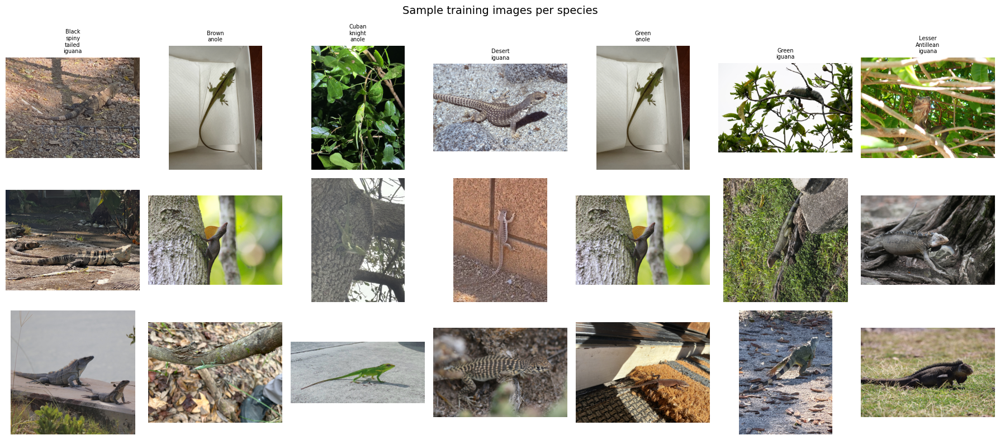

In [59]:
# ── Visualize a few training images ────────────────────────────────────────────
fig, axes = plt.subplots(3, 7, figsize=(18, 8))
class_names = sorted(class_counts.keys())

for col, cls in enumerate(class_names):
    images = list((TRAIN_DIR / cls).glob("*.jpg"))[:3]
    for row, img_path in enumerate(images):
        img = plt.imread(img_path)
        axes[row, col].imshow(img)
        axes[row, col].axis("off")
        if row == 0:
            axes[row, col].set_title(cls.replace("_", "\n"), fontsize=7)

plt.suptitle("Sample training images per species", fontsize=14)
plt.tight_layout()
plt.show()

## Step 3 — Build the data pipeline

We use `image_dataset_from_directory` which automatically infers class labels from the subfolder names. **No manual one-hot encoding needed!**

We also apply **data augmentation** to reduce overfitting.

In [60]:
# ── Training & validation datasets ─────────────────────────────────────────────
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    validation_split=VALIDATION_SPLIT,
    subset="training",
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="categorical",   # one-hot encoded -> use categorical_crossentropy
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    validation_split=VALIDATION_SPLIT,
    subset="validation",
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="categorical",
)

# The class names as discovered by Keras (alphabetical order)
CLASS_NAMES = train_ds.class_names
print("Class names (in model order):")
for i, name in enumerate(CLASS_NAMES):
    print(f"  {i}: {name}")

Found 1334 files belonging to 7 classes.
Using 1068 files for training.
Found 1334 files belonging to 7 classes.
Using 266 files for validation.
Class names (in model order):
  0: Black_spiny_tailed_iguana
  1: Brown_anole
  2: Cuban_knight_anole
  3: Desert_iguana
  4: Green_anole
  5: Green_iguana
  6: Lesser_Antillean_iguana


In [61]:
# ── Data augmentation (applied only during training) ───────────────────────────
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomFlip("vertical"),
    layers.RandomRotation(0.3),
    layers.RandomZoom(0.1),
    layers.RandomBrightness(0.1),
    layers.RandomContrast(0.1),
], name="data_augmentation")

def prepare_train(images, labels):
    images = data_augmentation(images, training=True)
    return images, labels

def prepare_val(images, labels):
    return images, labels

# ── Preprocessing — same logic as the course ───────────────────────────────────
# Apply EfficientNetV2S preprocessing upfront to the full dataset.
# This scales pixel values from [0, 255] to [-1, 1], exactly as the base model expects.
train_ds = train_ds.map(lambda x, y: (preprocess_input(x), y), num_parallel_calls=tf.data.AUTOTUNE)
val_ds   = val_ds.map(lambda x, y:   (preprocess_input(x), y), num_parallel_calls=tf.data.AUTOTUNE)

# Augmentation is applied on top, only for training
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.map(prepare_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds   = val_ds.map(prepare_val,   num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("Pipeline ready")

Pipeline ready


## Step 4 — Build the model

**Architecture:**
1. **Base model** — EfficientNetV2S pretrained on ImageNet, weights **frozen**
2. **Global Average Pooling** — collapses the feature maps into a single vector
3. **Our classification head** — Dense layers leading to a 7-class softmax output

> You can swap `EfficientNetV2S` for another backbone like `ResNet50V2` or `MobileNetV3Large` in one line.

In [62]:
# ── Frozen base model (feature extractor) ──────────────────────────────────────
base_model = EfficientNetV2S(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,     # remove the original ImageNet classification head
    weights="imagenet",    # use pretrained ImageNet weights
)
base_model.trainable = False   # freeze all base layers

# ── Our classification head ────────────────────────────────────────────────────
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(512, activation="relu"),
    BatchNormalization(),
    Dropout(0.3),
    Dense(256, activation="relu"),
    BatchNormalization(),
    Dropout(0.2),
    Dense(128, activation="relu"),
    Dropout(0.1),
    Dense(NUM_CLASSES, activation="softmax"),
], name="iguana_classifier")

model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)

model.summary()

Model: "iguana_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetv2-s (Functional)   │ (None, 10, 10, 1280)   │    20,331,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,160,551 (80.72 MB)

 Trainable params: 825,095 (3.15 MB)

 Non-trainable params: 20,335,456 (77.57 MB)

## Step 5 — Train the model

In [63]:
from tensorflow.keras.callbacks import Callback
from sklearn.metrics import f1_score
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import numpy as np

class ValF1Callback(Callback):
    def __init__(self, val_data):
        super().__init__()
        self.val_data = val_data

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        y_true, y_pred = [], []

        for images, labels in self.val_data:
            preds = self.model.predict(images, verbose=0)
            y_true.extend(np.argmax(labels.numpy(), axis=1))
            y_pred.extend(np.argmax(preds, axis=1))

        val_f1_macro = f1_score(y_true, y_pred, average="macro")
        val_f1_weighted = f1_score(y_true, y_pred, average="weighted")

        # Add to Keras logs so values are available in history.history and shown by fit
        logs["val_f1_macro"] = val_f1_macro
        logs["val_f1_weighted"] = val_f1_weighted

callbacks = [
    ValF1Callback(val_ds),
]

# Target the often mistaken classes by computing class weights based on the training labels
labels_list = []
for _, labels in train_ds:
    labels_list.extend(np.argmax(labels.numpy(), axis=1))

class_weights = compute_class_weight("balanced", classes=np.arange(NUM_CLASSES), y=labels_list)
class_weight_dict = dict(enumerate(class_weights))
print(class_weight_dict)



{0: np.float64(0.9360210341805434), 1: np.float64(0.9656419529837251), 2: np.float64(1.010406811731315), 3: np.float64(1.0379008746355685), 4: np.float64(1.0522167487684728), 5: np.float64(1.0171428571428571), 6: np.float64(0.9907235621521335)}


In [64]:
print(f"Training with frozen base for ALL {EPOCHS} epochs (No Early Stopping!)...")
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks,
    class_weight=class_weight_dict,
)

# Save the model once after all epochs are done
model.save(MODEL_PATH)
print(f"\nModel saved to: {MODEL_PATH}")

Training with frozen base for ALL 10 epochs (No Early Stopping!)...
Epoch 1/10


KeyboardInterrupt: 

In [ ]:
# # ── Fine-Tuning Configuration — change these values ───────────────────────────
# FINETUNE_LAYERS = 50   # number of layers from the END of the base model to unfreeze
#                         # EfficientNetV2S base has ~596 layers total.
#                         # 30  = only the final block (safe starting point)
#                         # 100 = roughly the last quarter of the network
#                         # 596 = unfreeze everything (slow, risk of overwriting ImageNet features)
# FINETUNE_LR     = 1e-5  # keep this very small! (100x smaller than the first training run)
# FINETUNE_EPOCHS = 3    # how many epochs to fine-tune for

# # ── Step 1: Unfreeze the base model, then refreeze everything except the last FINETUNE_LAYERS ──
# base_model = model.layers[0]   # the EfficientNetV2S layer inside our Sequential model
# base_model.trainable = True    # unfreeze everything first

# # Now refreeze all layers BEFORE the last FINETUNE_LAYERS
# freeze_until = len(base_model.layers) - FINETUNE_LAYERS
# for layer in base_model.layers[:freeze_until]:
#     layer.trainable = False

# # Show what we ended up with
# trainable_count = sum(1 for l in base_model.layers if l.trainable)
# frozen_count    = sum(1 for l in base_model.layers if not l.trainable)
# print(f"Base model total layers : {len(base_model.layers)}")
# print(f"Frozen layers           : {frozen_count}")
# print(f"Trainable layers        : {trainable_count} (the last {FINETUNE_LAYERS})")

# # ── Step 2: Recompile — mandatory after changing trainable flags ───────────────
# model.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=FINETUNE_LR),
#     loss="categorical_crossentropy",
#     metrics=["accuracy"]
# )

# # ── Step 3: Fine-tune — reuse the same ValF1Callback ──────────────────────────
# print(f"Starting fine-tuning for {FINETUNE_EPOCHS} epochs with lr={FINETUNE_LR}...")
# history_finetune = model.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=FINETUNE_EPOCHS,
#     callbacks=[ValF1Callback(val_ds)],
# )

# # ── Step 4: Overwrite the original model with the fine-tuned version ──────────
# model.save(MODEL_PATH)
# print(f"Fine-tuned model saved (overwrote original) to: {MODEL_PATH}")


Base model total layers : 513
Frozen layers           : 483
Trainable layers        : 30 (the last 500)
Starting fine-tuning for 3 epochs with lr=1e-05...
Epoch 1/3


KeyboardInterrupt: 

## Step 6 — Visualize training

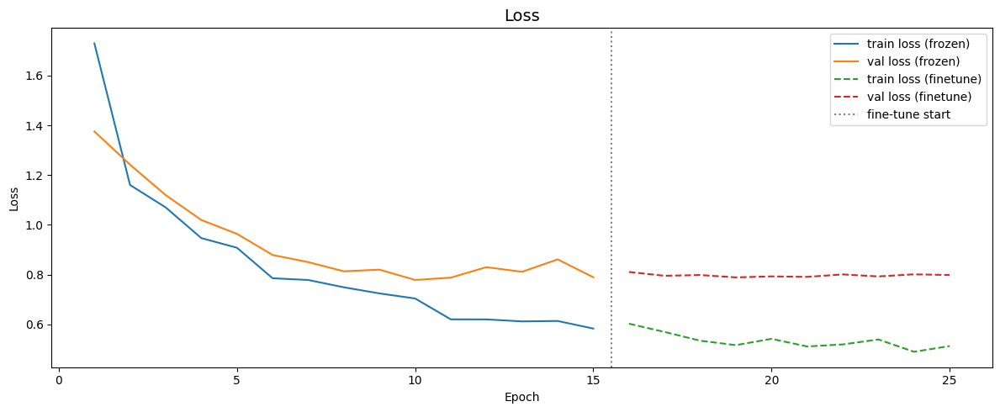

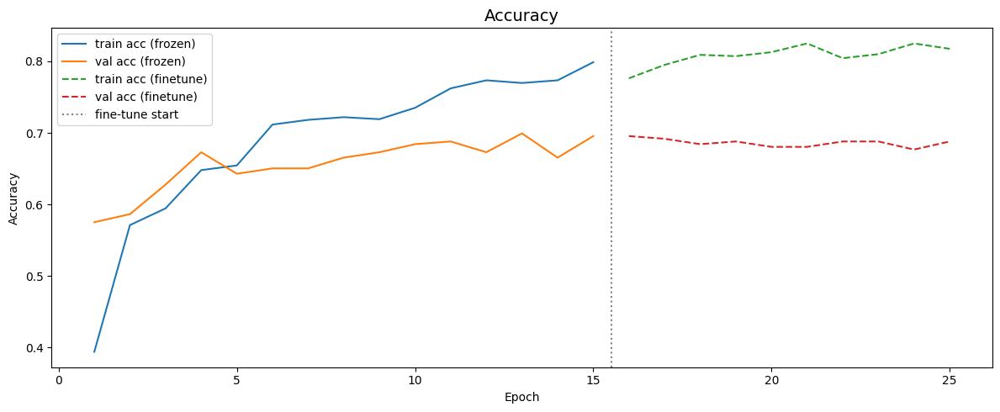

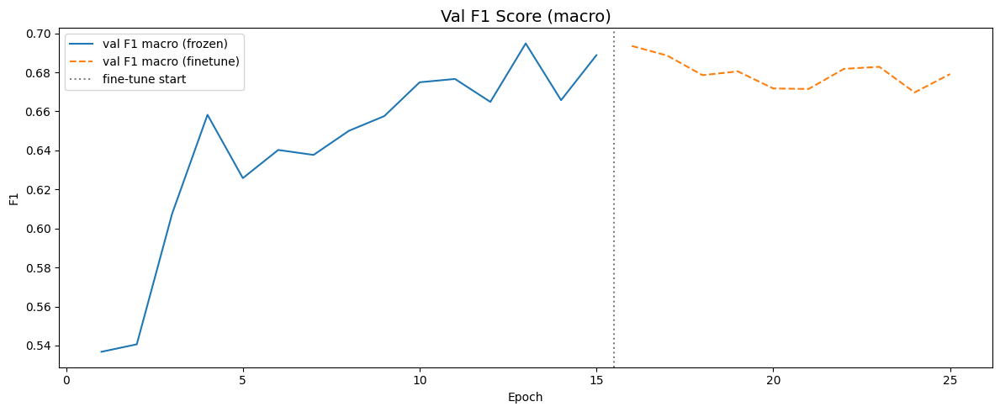

In [ ]:
def combine_histories(h1, h2, key):
    """Concatenate a metric across two history objects, offset x-axis for phase 2."""
    v1 = h1.history.get(key, [])
    v2 = h2.history.get(key, []) if h2 else []
    return list(range(1, len(v1)+1)), v1, list(range(len(v1)+1, len(v1)+len(v2)+1)), v2

# ── Loss ──────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 5))
x1, y1, x2, y2 = combine_histories(history, history_finetune if "history_finetune" in vars() else type("H", (), {"history": {}})(), "loss")
ax.plot(x1, y1, label="train loss (frozen)")
ax.plot(x1, history.history["val_loss"], label="val loss (frozen)")
if x2:
    ax.plot(x2, y2, "--", label="train loss (finetune)")
    ax.plot(x2, history_finetune.history["val_loss"], "--", label="val loss (finetune)")
    ax.axvline(x=x1[-1] + 0.5, color="grey", linestyle=":", label="fine-tune start")
ax.set_title("Loss", fontsize=14); ax.set_xlabel("Epoch"); ax.set_ylabel("Loss")
ax.legend()
plt.tight_layout()
plt.show()

# ── Accuracy ──────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 5))
x1, y1, x2, y2 = combine_histories(history, history_finetune if "history_finetune" in vars() else type("H", (), {"history": {}})(), "accuracy")
ax.plot(x1, y1, label="train acc (frozen)")
ax.plot(x1, history.history["val_accuracy"], label="val acc (frozen)")
if x2:
    ax.plot(x2, y2, "--", label="train acc (finetune)")
    ax.plot(x2, history_finetune.history["val_accuracy"], "--", label="val acc (finetune)")
    ax.axvline(x=x1[-1] + 0.5, color="grey", linestyle=":", label="fine-tune start")
ax.set_title("Accuracy", fontsize=14); ax.set_xlabel("Epoch"); ax.set_ylabel("Accuracy")
ax.legend()
plt.tight_layout()
plt.show()

# ── F1 (macro) ────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 5))
f1_frozen   = history.history.get("val_f1_macro", [])
f1_finetune = history_finetune.history.get("val_f1_macro", []) if "history_finetune" in vars() else []
x1 = list(range(1, len(f1_frozen)+1))
x2 = list(range(len(f1_frozen)+1, len(f1_frozen)+len(f1_finetune)+1))
if f1_frozen:
    ax.plot(x1, f1_frozen, label="val F1 macro (frozen)")
if f1_finetune:
    ax.plot(x2, f1_finetune, "--", label="val F1 macro (finetune)")
    ax.axvline(x=x1[-1] + 0.5, color="grey", linestyle=":", label="fine-tune start")
ax.set_title("Val F1 Score (macro)", fontsize=14); ax.set_xlabel("Epoch"); ax.set_ylabel("F1")
ax.legend()
plt.tight_layout()
plt.show()


## Step 7 — Evaluate on validation set

In [ ]:
val_loss, val_acc = model.evaluate(val_ds, verbose=1)
print(f"\nValidation accuracy: {val_acc:.4f} ({val_acc*100:.2f}%)")
print(f"\nValidation accuracy: {val_acc:.4f} ({val_acc*100:.2f}%)")

9/9 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.6880 - loss: 0.7987

Validation accuracy: 0.6880 (68.80%)

Validation accuracy: 0.6880 (68.80%)


Found 1334 files belonging to 7 classes.
Using 266 files for validation.


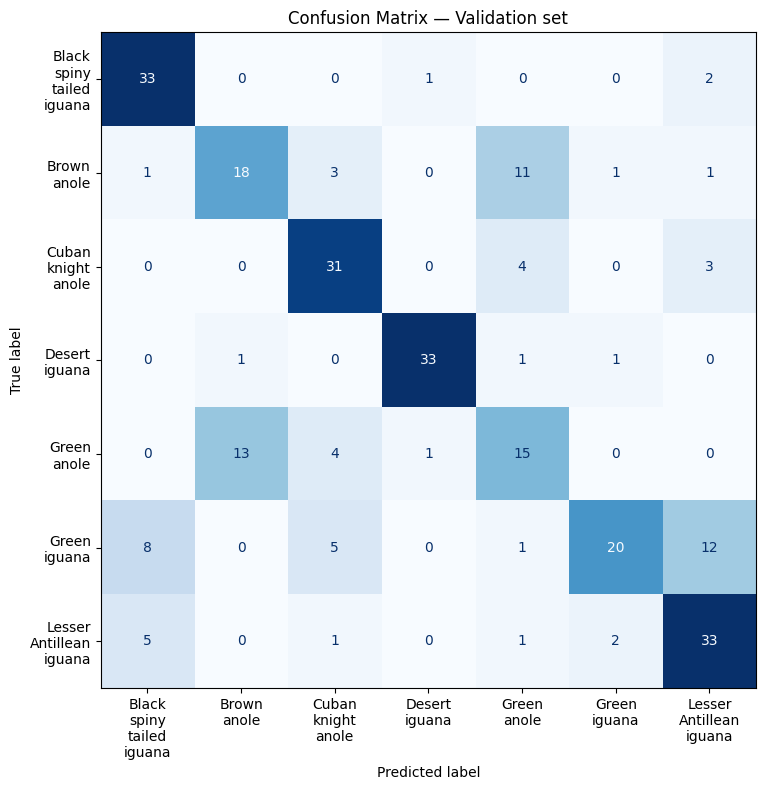

In [ ]:
# ── Run predictions on a non-augmented, non-shuffled val set ─────────────────
val_ds_raw = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    validation_split=VALIDATION_SPLIT,
    subset="validation",
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=False,
)

y_true, y_pred, all_imgs, all_probs = [], [], [], []
for images_raw, labels in val_ds_raw:
    images_prep = preprocess_input(images_raw)
    preds = model.predict(images_prep, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))
    all_imgs.extend(images_raw.numpy().astype("uint8"))
    all_probs.extend(preds)

# ── Confusion matrix ────────────────────────────────────────────────────────────
y_true, y_pred, all_imgs, all_probs = [], [], [], []
for images, labels in val_ds:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))
    all_imgs.extend(images.numpy().astype("uint8"))
    all_probs.extend(preds)

cm = confusion_matrix(y_true, y_pred, labels=list(range(len(CLASS_NAMES))))
disp = ConfusionMatrixDisplay(cm, display_labels=[c.replace("_", "\n") for c in CLASS_NAMES])
fig, ax = plt.subplots(figsize=(10, 8))
disp.plot(ax=ax, colorbar=False, cmap="Blues")
plt.title("Confusion Matrix — Validation set")
plt.tight_layout()
plt.show()


## Sanity Check — Most confident mistakes

These are the errors the model made with the highest confidence — the cases where it was **most wrong**. These are the most useful to inspect because they reveal systematic confusion between classes.

83 mistakes total. Showing the most confident ones first.


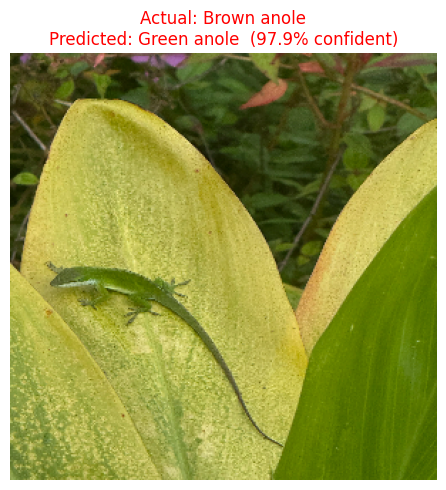

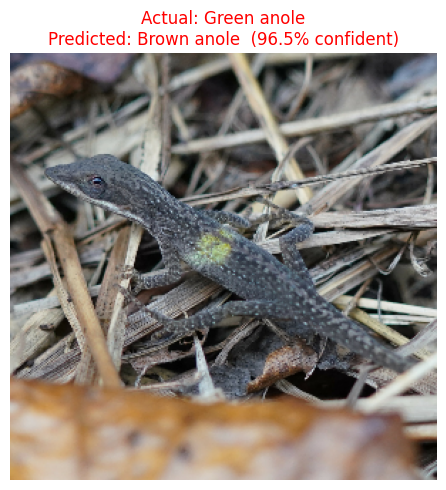

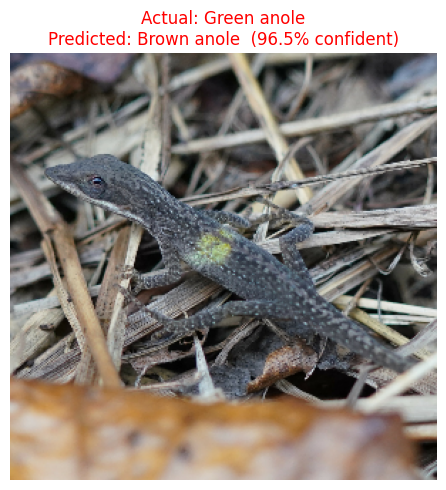

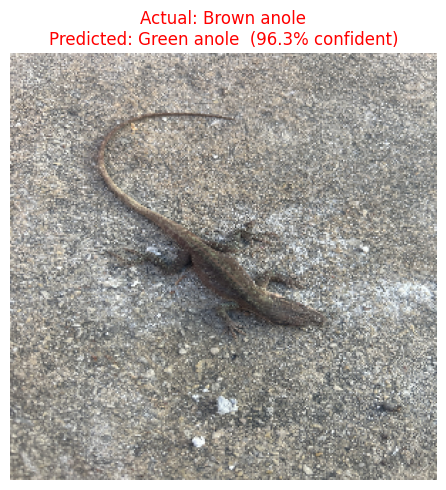

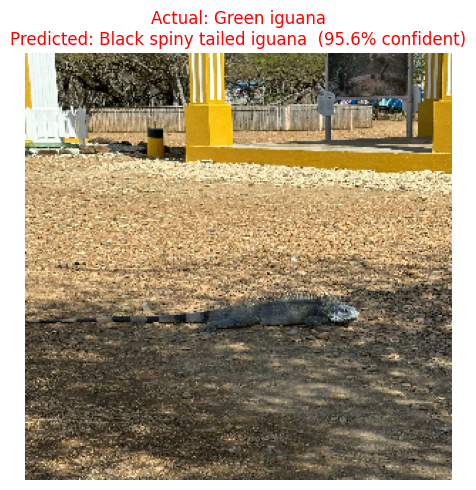

...

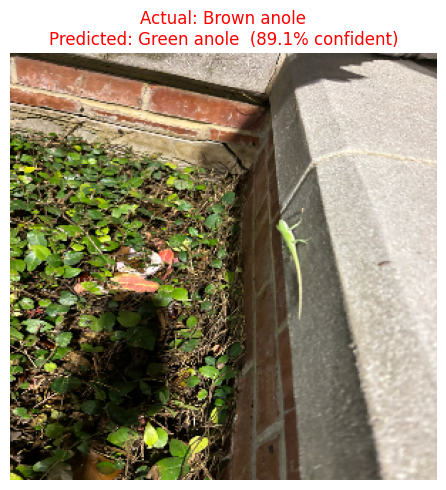

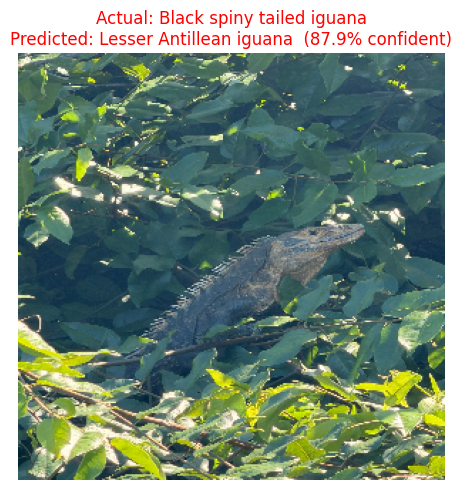

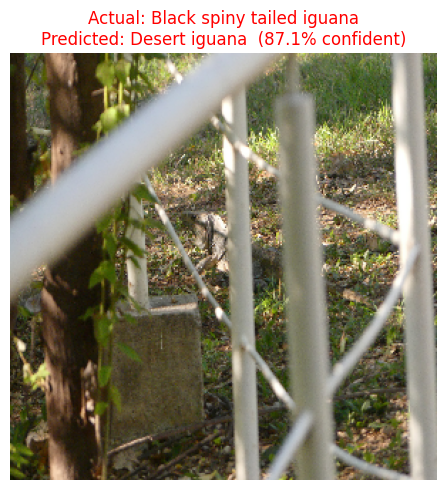

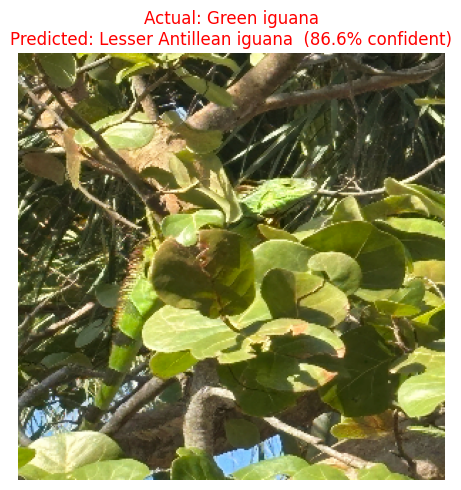

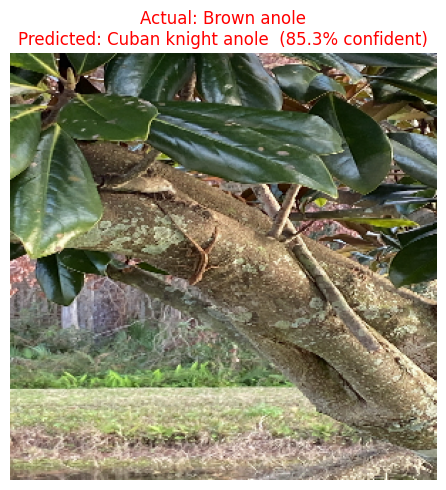

In [ ]:
# ── Most confident mistakes ────────────────────────────────────────────────────
mistakes = [
    {
        "idx":        i,
        "actual":     CLASS_NAMES[y_true[i]],
        "predicted":  CLASS_NAMES[y_pred[i]],
        "confidence": float(all_probs[i][y_pred[i]]),
        "img":        all_imgs[i],
    }
    for i in range(len(y_true)) if y_true[i] != y_pred[i]
]

mistakes = sorted(mistakes, key=lambda m: m["confidence"], reverse=True)
print(f"{len(mistakes)} mistakes total. Showing the most confident ones first.")

show = mistakes[:20]

for m in show:
    actual    = m["actual"].replace("_", " ")
    predicted = m["predicted"].replace("_", " ")
    conf      = m["confidence"]

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(m["img"])
    ax.axis("off")
    ax.set_title(
        f"Actual: {actual}\nPredicted: {predicted}  ({conf*100:.1f}% confident)",
        fontsize=12, color="red"
    )
    plt.tight_layout()
    plt.show()


## Step 8 — Generate submission file

Read the test images, predict, map class indices back to the numeric IDs from `Classes_nummering.xlsx`, and write `submission.csv`.

In [ ]:
# ── Load class numbering from xlsx ─────────────────────────────────────────────
# Inspect the columns printed in Step 2 and adjust the indices here if needed
classes_df = pd.read_excel(CLASSES_XLSX)

NAME_COL = classes_df.columns[0]   # column with the species name string
ID_COL   = classes_df.columns[1]   # column with the numeric id

name_to_id = dict(zip(classes_df[NAME_COL], classes_df[ID_COL]))
print("name -> id mapping:", name_to_id)

name -> id mapping: {0: 'Black_spiny_tailed_iguana', 1: 'Brown_anole', 2: 'Cuban_knight_anole', 3: 'Desert_iguana', 4: 'Green_anole', 5: 'Green_iguana', 6: 'Lesser_Antillean_iguana'}


In [ ]:
# ── Read test ids ───────────────────────────────────────────────────────────────
test_df   = pd.read_csv(TEST_CSV)
ID_COLUMN = test_df.columns[0]   # usually 'id' or 'ID'
test_ids  = test_df[ID_COLUMN].tolist()
print(f"{len(test_ids)} test images to predict")

326 test images to predict


In [ ]:
# ── Predict on test images ──────────────────────────────────────────────────────
predictions = []

for img_id in test_ids:
    for ext in [".jpg", ".jpeg", ".png"]:
        img_path = TEST_DIR / f"{img_id}{ext}"
        if img_path.exists():
            break

    img       = tf.keras.utils.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = preprocess_input(img_array)             # same preprocessing as training
    img_array = tf.expand_dims(img_array, axis=0)

    pred       = model.predict(img_array, verbose=0)
    class_name = CLASS_NAMES[np.argmax(pred[0])]
    predictions.append(classes_df.loc[classes_df[ID_COL] == class_name, NAME_COL].iloc[0])

print(f"Done! {len(predictions)} predictions made.")
print("Sample:", predictions[:10])

Done! 326 predictions made.
Sample: [np.int64(0), np.int64(5), np.int64(2), np.int64(5), np.int64(0), np.int64(4), np.int64(6), np.int64(4), np.int64(4), np.int64(1)]


In [ ]:
# ── Write submission.csv ────────────────────────────────────────────────────────
submission_df = pd.DataFrame({ID_COLUMN: test_ids, "label": predictions})
submission_df.to_csv(SUBMISSION_PATH, index=False)
print(f"Submission saved to: {SUBMISSION_PATH}")
print(submission_df.head(10))

Submission saved to: saved_models\submission.csv
   id  label
0   1      0
1   2      5
2   3      2
3   4      5
4   5      0
5   6      4
6   7      6
7   8      4
8   9      4
9  10      1


---
## Things to experiment with

Once the baseline is working, here are knobs you can turn to improve accuracy:

| What | Where | Try |
|------|-------|-----|
| **Base model** | Step 4 | Swap `EfficientNetV2S` -> `ResNet50V2`, `MobileNetV3Large`, `ConvNeXtBase` |
| **Image size** | Step 1 config | 224 -> 300 or 384 (bigger = more detail, more memory) |
| **Augmentation** | Step 3 | Add `RandomFlip("vertical")`, `RandomTranslation`, `RandomShear` |
| **Head architecture** | Step 4 | More/fewer Dense layers, different Dropout rates |
| **Epochs** | Step 1 config | Increase `EPOCHS` |
| **Fine-tuning** | After Step 5 | Set `base_model.trainable = True`, recompile with `lr=1e-5`, train again |
| **Class weights** | `model.fit()` | Add `class_weight=...` if classes are imbalanced |
| **Batch size** | Step 1 config | Smaller = noisier gradients (sometimes helps generalization) |

In [ ]:
# Validation F1 score (macro + weighted)
from pathlib import Path
import numpy as np
import tensorflow as tf
from sklearn.metrics import f1_score, classification_report

DATA_DIR = Path("data")
TRAIN_DIR = DATA_DIR / "train"
MODEL_PATH = Path("saved_models") / "iguana_model.keras"

BATCH_SIZE = 32
VALIDATION_SPLIT = 0.2
SEED = 42

preprocess_input = tf.keras.applications.efficientnet_v2.preprocess_input

model = tf.keras.models.load_model(MODEL_PATH)
model_input_size = model.input_shape[1:3]

val_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    validation_split=VALIDATION_SPLIT,
    subset="validation",
    seed=SEED,
    image_size=model_input_size,
    batch_size=BATCH_SIZE,
    label_mode="categorical",
)

CLASS_NAMES = val_ds.class_names
val_ds = val_ds.map(lambda x, y: (preprocess_input(x), y), num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)

y_true, y_pred = [], []
for images, labels in val_ds:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

val_f1_macro = f1_score(y_true, y_pred, average="macro")
val_f1_weighted = f1_score(y_true, y_pred, average="weighted")

print(f"Validation F1 (macro):    {val_f1_macro:.4f}")
print(f"Validation F1 (weighted): {val_f1_weighted:.4f}")
print("\nPer-class report:")
print(classification_report(y_true, y_pred, target_names=CLASS_NAMES, digits=4, zero_division=0))

Found 1334 files belonging to 7 classes.
Using 266 files for validation.
Validation F1 (macro):    0.6675
Validation F1 (weighted): 0.6662

Per-class report:
                           precision    recall  f1-score   support

Black_spiny_tailed_iguana     0.6000    0.9167    0.7253        36
              Brown_anole     0.5926    0.4571    0.5161        35
       Cuban_knight_anole     0.6857    0.6316    0.6575        38
            Desert_iguana     0.9706    0.9167    0.9429        36
              Green_anole     0.5000    0.6667    0.5714        33
             Green_iguana     0.6857    0.5217    0.5926        46
  Lesser_Antillean_iguana     0.7222    0.6190    0.6667        42

                 accuracy                         0.6692       266
                macro avg     0.6795    0.6756    0.6675       266
             weighted avg     0.6831    0.6692    0.6662       266

